# Regresión logística multiclase


## Acerca de los datos

[Dry Bean Dataset](https://www.kaggle.com/datasets/sansuthi/dry-bean-dataset)

### Informacion del conjunto de Datos:

Fueron empleados siete tipos distintos de granos secos en esta investigación, teniendo en cuenta características tales como forma, tipo y estructura, de acuerdo con la situación del mercado. Se creó un sistema de visión computacional capaz de distinguir siete variedades registradas de granos secos similares entre sí, con el fin de obtener una clasificación homogénea de semillas.

Para el modelo de clasificación, se capturaron imágenes de 13,611 granos de 7 variedades diferentes de granos secos registrados mediante una cámara de alta resolución. Las imágenes de granos obtenidas por el sistema de visión computacional fueron sometidas a etapas de segmentación y extracción de características, logrando extraer un total de 16 rasgos; 12 dimensiones y 4 formas geométricas, desde los granos.

### Informacion de Atributos:

1. Área (A): Área de una zona de un grano y número de pixeles dentro de sus límites.

2. Perímetro (P): El perímetro de un grano se define como la longitud de su borde.

3. Longitud del eje mayor (L): La distancia entre los extremos de la línea más larga que puede ser trazada desde un grano.

4. Longitud del eje menor (l): La línea más larga que puede ser dibujada desde el grano mientras permanezca perpendicular al eje principal.

5. Relación de aspecto (K): Define la relación entre L y l.

6. Ecentricidad (Ec): La ec eccentricidad del elipse que tiene los mismos momentos que la región.

7. Área convexa (C): Número de pixeles en el polígono convexo más pequeño que pueda contener el área de una semilla de grano.

8. Diámetro equivalente (Ed): Diámetro de un círculo con la misma área que un área de grano.

9. Extensión (Ex): La razón entre los pixeles en el marco delimitador y el área de grano.

10. Sólidez (S): También conocida como convexidad. Es la razón entre los pixeles en la carcasa convexa y los encontrados en los granos.

11. Redondez (R): Calculada con la siguiente fórmula: (4πA)/(P²).

12. Compacidad (CO): Mide la redondez de un objeto: Ed/L.

13. Forma 1 (SF1)

14. Forma 2 (SF2)

15. Forma 3 (SF3)

16. Forma 4 (SF4)

**Clases (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz y Sira).**


## Importar librerías


In [1]:
# Importando librerias necesarias para analizar los datos
import pandas as pd
import numpy as np

# Graficas
import matplotlib.pyplot as plt
import seaborn as sns

# Escalamiento de datos
from sklearn.preprocessing import StandardScaler

# Separacion de datos y validacion para overfitin
# Cross Validation para verificar el overfiting
from sklearn.model_selection import train_test_split, KFold, cross_val_score

# Modelo de regresion logistica
from sklearn.linear_model import LogisticRegression

# Verificando las metricas del modelo
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
)

# Cual es el mejor modelo de regresion logistica
from sklearn.model_selection import GridSearchCV

# Balanceo de datos con undersampling
from imblearn.under_sampling import RandomUnderSampler

# warning
import warnings

warnings.filterwarnings("ignore")
sns.set_theme(font_scale=1, style="whitegrid", palette="pastel", context="notebook")

## Carga de datos


In [2]:
df = pd.read_csv("../data/Dry_Bean.csv")
df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653247,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


In [3]:
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [4]:
df.shape

(13611, 17)

Garantizar que el dataset sea de multiclase


In [5]:
df["Class"].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

7 distintos tipos de frijoes a analizar


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Area,13611.0,53048.284549,29324.095717,20420.000000,36328.000000,44652.000000,61332.000000,254616.000000
Perimeter,13611.0,855.283459,214.289696,524.736000,703.523500,794.941000,977.213000,1985.370000
MajorAxisLength,13611.0,320.141867,85.694186,183.601165,253.303633,296.883367,376.495012,738.860154
MinorAxisLength,13611.0,202.270714,44.970091,122.512653,175.848170,192.431733,217.031741,460.198497
AspectRation,13611.0,1.583242,0.246678,1.024868,1.432307,1.551124,1.707109,2.430306
Eccentricity,13611.0,0.750895,0.092002,0.218951,0.715928,0.764441,0.810466,0.911423
ConvexArea,13611.0,53768.200206,29774.915817,20684.000000,36714.500000,45178.000000,62294.000000,263261.000000
EquivDiameter,13611.0,253.064220,59.177120,161.243764,215.068003,238.438026,279.446467,569.374358
Extent,13611.0,0.749733,0.049086,0.555315,0.718634,0.759859,0.786851,0.866195
Solidity,13611.0,0.987143,0.004660,0.919246,0.985670,0.988283,0.990013,0.994677


Al realizar un análisis visual del resultado de la función describe() del dataframe, no se detectan valores nulos o outliers evidentes.


## Limpieza de datos


### Eliminar Duplicados


In [7]:
# Eliminar datos duplicados
df.drop_duplicates(inplace=True)

In [8]:
df.shape

(13543, 17)

### Manejo de datos nulos


In [9]:
df.isna().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

No tenemos valores nulos


In [10]:
print(df.shape, df.isnull().sum(), sep="\n\n")

(13543, 17)

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64


Se han eliminado 68 valores duplicados y no hay valores nulos en el conjunto de datos, por lo que procederemos con el análisis.


## Undersampling o Balanceo de Dataset

La regresión logística funciona mejor con datasets balanceados. Por lo tanto, en este análisis veremos la proporción de los datos para considerar si es necesario aplicar técnicas de balanceo de clases.


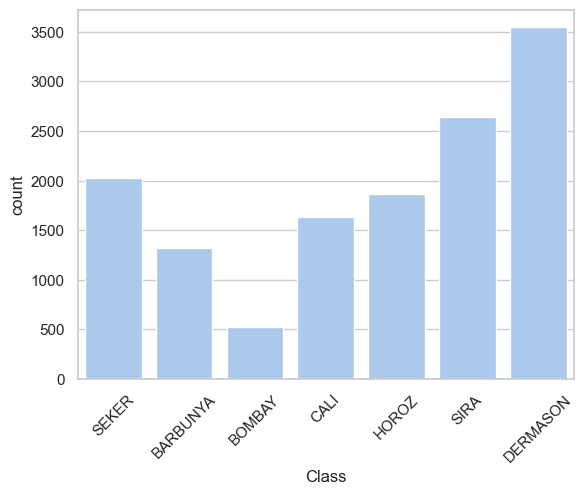

In [11]:
sns.countplot(data=df, x="Class")
plt.xticks(rotation=45)
plt.show()

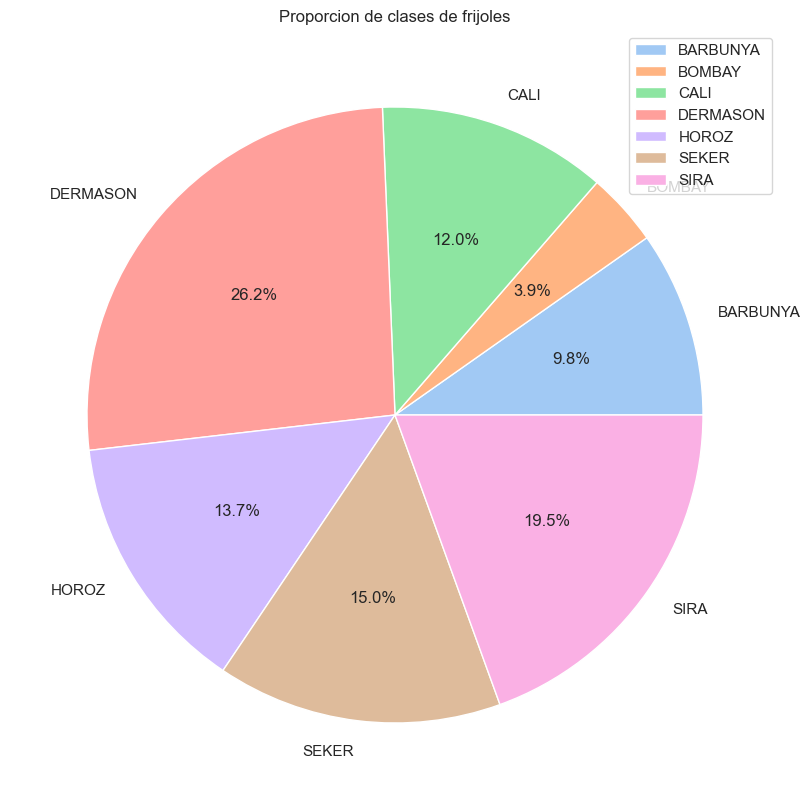

In [12]:
# Ver la proporcion en grafico de pie
labels, counts = np.unique(df["Class"], return_counts=True)

plt.figure(figsize=(10, 10))
plt.pie(counts, autopct="%1.1f%%", labels=labels)
plt.title("Proporcion de clases de frijoles")
plt.legend()
plt.show()

Se observa una desproporción en la distribución de los tipos de frijoles en el conjunto de datos.

Los resultados muestran que Dermason y Sira representan más del 45% de las muestras totales, mientras que Bombay tiene una representación del 3.85%.

Se realizará un undersampling en lugar de un oversampling. Esto se debe a que un oversampling podría generar overfitting y una menor capacidad de generalización del modelo al duplicar o triplicar algunas muestras. El undersampling equilibra las clases y mejora la capacidad de generalización del modelo.


In [13]:
under_sampler = RandomUnderSampler(random_state=42)

In [14]:
under_sampler

RandomUnderSampler(random_state=42)

In [15]:
# Quitar la variable objetivo
X = df.drop("Class", axis=1)
y = df["Class"]

In [16]:
X_res, y_res = under_sampler.fit_resample(X, y)
y_res

2754    BARBUNYA
2506    BARBUNYA
2267    BARBUNYA
2449    BARBUNYA
2076    BARBUNYA
          ...   
8692        SIRA
7578        SIRA
7924        SIRA
9972        SIRA
9720        SIRA
Name: Class, Length: 3654, dtype: object

Todas nuestras dimensiones (X e Y) tienen la misma magnitud


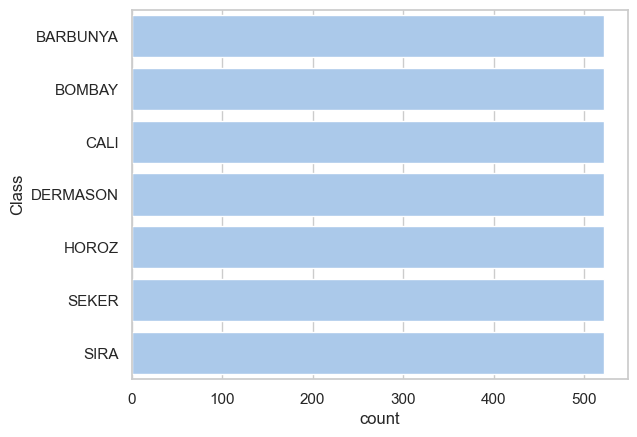

In [17]:
sns.countplot(data=y_res)
plt.show()

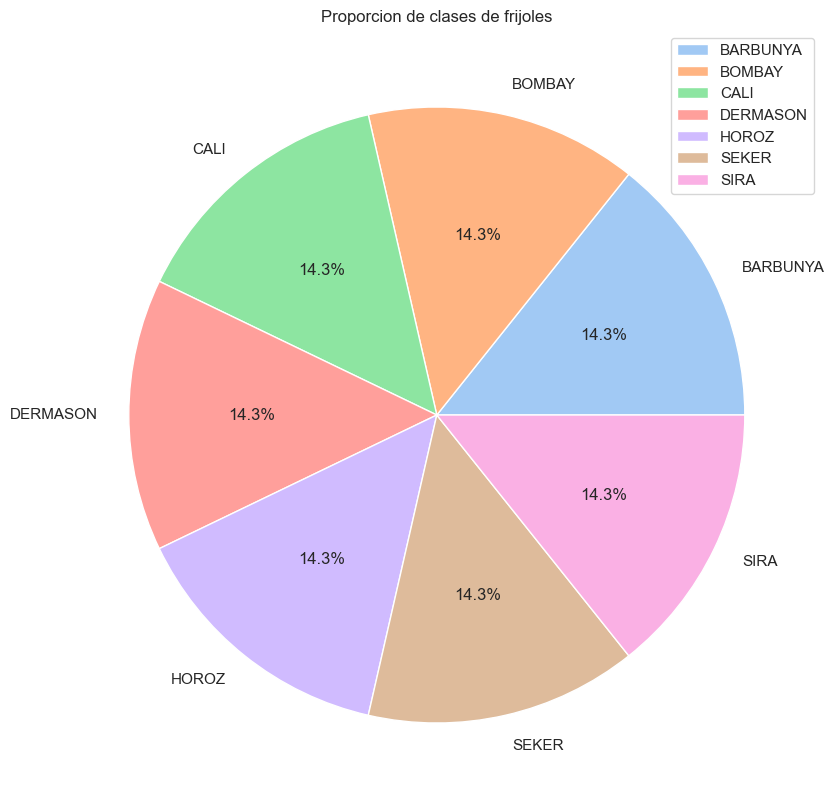

In [18]:
# Ver la proporcion en grafico de pie
labels, counts = np.unique(y_res, return_counts=True)

plt.figure(figsize=(10, 10))
plt.pie(counts, autopct="%1.1f%%", labels=labels)
plt.title("Proporcion de clases de frijoles")
plt.legend()
plt.show()

Se redujo significativamente el tamaño del conjunto de datos de 13543 a 3654 al realizar undersampling. A pesar de la pérdida de datos, esto evita el riesgo de generar datos no relevantes y garantiza que los datos utilizados en el análisis sean reales y significativos.


In [19]:
df.shape

(13543, 17)

In [20]:
X_res.shape

(3654, 16)

Se redujo significativamente el tamaño del conjunto de datos de 13543 a 3654 al realizar undersampling. A pesar de la pérdida de datos, esto evita el riesgo de generar datos no relevantes y garantiza que los datos utilizados en el análisis sean reales y significativos.


## Conversion a numericos


In [21]:
# Convertir los datos de texto a numeros
list(np.unique(y_res))

['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA']

In [22]:
DICT = {key: item for key, item in zip(y_res.unique(), range(len(y_res.unique())))}

In [23]:
DICT

{'BARBUNYA': 0,
 'BOMBAY': 1,
 'CALI': 2,
 'DERMASON': 3,
 'HOROZ': 4,
 'SEKER': 5,
 'SIRA': 6}

In [24]:
y_res = pd.Series(map(lambda x: DICT[x], y_res))

In [25]:
y_res

0       0
1       0
2       0
3       0
4       0
       ..
3649    6
3650    6
3651    6
3652    6
3653    6
Length: 3654, dtype: int64

In [26]:
list(np.unique(y_res))

[0, 1, 2, 3, 4, 5, 6]

In [27]:
y_res.replace(to_replace=0, value=1, inplace=True)

In [28]:
list(np.unique(y_res))

[1, 2, 3, 4, 5, 6]

## Análisis exploratorio de datos


### Correlaccion

Realizaremos un análisis de correlación para evitar la presencia de multicolinealidad en nuestro conjunto de datos.


In [29]:
# Para analizar todo el conjunto
new_data = X_res.copy(deep=True)
new_data["Class"] = y_res

In [30]:
new_data.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
2754,70776,1060.894,386.619944,234.100208,1.651515,0.795842,71978,300.191276,0.775763,0.983300,0.790227,0.776451,0.005463,0.001225,0.602875,0.995658,5.0
2506,66370,1004.139,339.287072,249.883085,1.357783,0.676443,67637,290.697280,0.720536,0.981268,0.827169,0.856789,0.005112,0.001699,0.734087,0.996731,4.0
2267,60736,985.501,342.445302,226.741775,1.510288,0.749393,61680,278.085377,0.789353,0.984695,0.785854,0.812058,0.005638,0.001512,0.659438,0.995941,4.0
2449,65219,1011.110,353.650546,235.308999,1.502920,0.746512,66672,288.165594,0.719436,0.978207,0.801654,0.814831,0.005423,0.001475,0.663950,0.997864,4.0
2076,51332,889.637,330.822804,198.618899,1.665616,0.799716,52283,255.651975,0.751688,0.981811,0.815028,0.772776,0.006445,0.001418,0.597183,0.994678,3.0


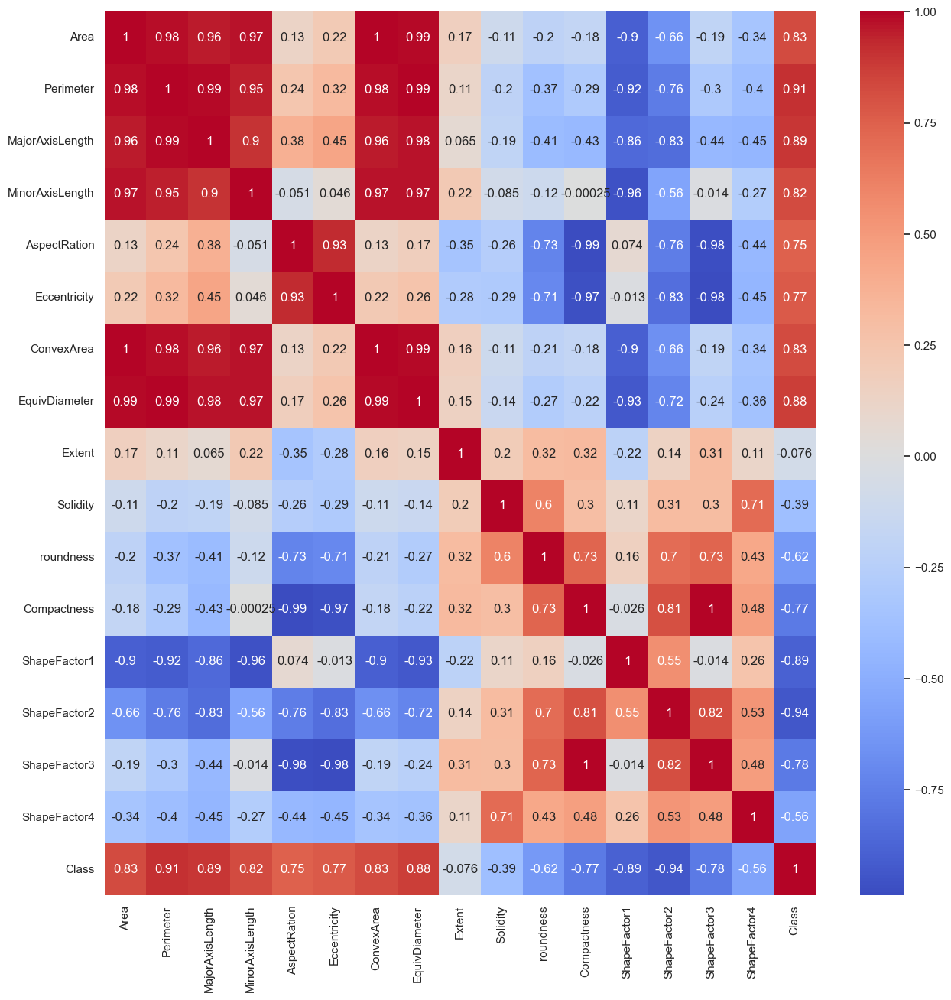

In [31]:
plt.figure(figsize=(15, 15))
sns.heatmap(data=new_data.corr(), annot=True, cmap="coolwarm")
plt.show()

## Insight

En el análisis de correlación, se observó en el heatmap que la variable ConvexArea presenta una alta correlación con la variable Area, en una relación de 1 a 1, y también se encuentra altamente correlacionada con el Perimeter, MajorAxisLenght y MinorAxisLenght.

Por otro lado, la variable EquivDiameter muestra una alta correlación con las variables Area, Perimeter, Width y Length.

Estas correlaciones indican la presencia de multicolinealidad entre estas variables, por lo tanto, se procederá a dropear esas variables para evitar la multicolinealidad.


Eliminar las variables altamente correlacionada


In [32]:
X_res.drop(["ConvexArea", "EquivDiameter"], axis=1, inplace=True)

In [33]:
X_res

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
2754,70776,1060.894,386.619944,234.100208,1.651515,0.795842,0.775763,0.983300,0.790227,0.776451,0.005463,0.001225,0.602875,0.995658
2506,66370,1004.139,339.287072,249.883085,1.357783,0.676443,0.720536,0.981268,0.827169,0.856789,0.005112,0.001699,0.734087,0.996731
2267,60736,985.501,342.445302,226.741775,1.510288,0.749393,0.789353,0.984695,0.785854,0.812058,0.005638,0.001512,0.659438,0.995941
2449,65219,1011.110,353.650546,235.308999,1.502920,0.746512,0.719436,0.978207,0.801654,0.814831,0.005423,0.001475,0.663950,0.997864
2076,51332,889.637,330.822804,198.618899,1.665616,0.799716,0.751688,0.981811,0.815028,0.772776,0.006445,0.001418,0.597183,0.994678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8692,44358,785.631,288.303275,196.970714,1.463686,0.730225,0.791937,0.987973,0.903118,0.824312,0.006499,0.001851,0.679490,0.994560
7578,37641,742.538,284.313737,169.740814,1.674987,0.802227,0.744187,0.987642,0.857894,0.769995,0.007553,0.001638,0.592892,0.993087
7924,40668,747.000,271.731569,191.687622,1.417575,0.708780,0.712162,0.985724,0.915844,0.837416,0.006682,0.002027,0.701266,0.994097
9972,53233,893.511,329.969126,206.375684,1.598876,0.780273,0.689154,0.985395,0.837898,0.788991,0.006199,0.001482,0.622507,0.995312


## Visualizacion de datos


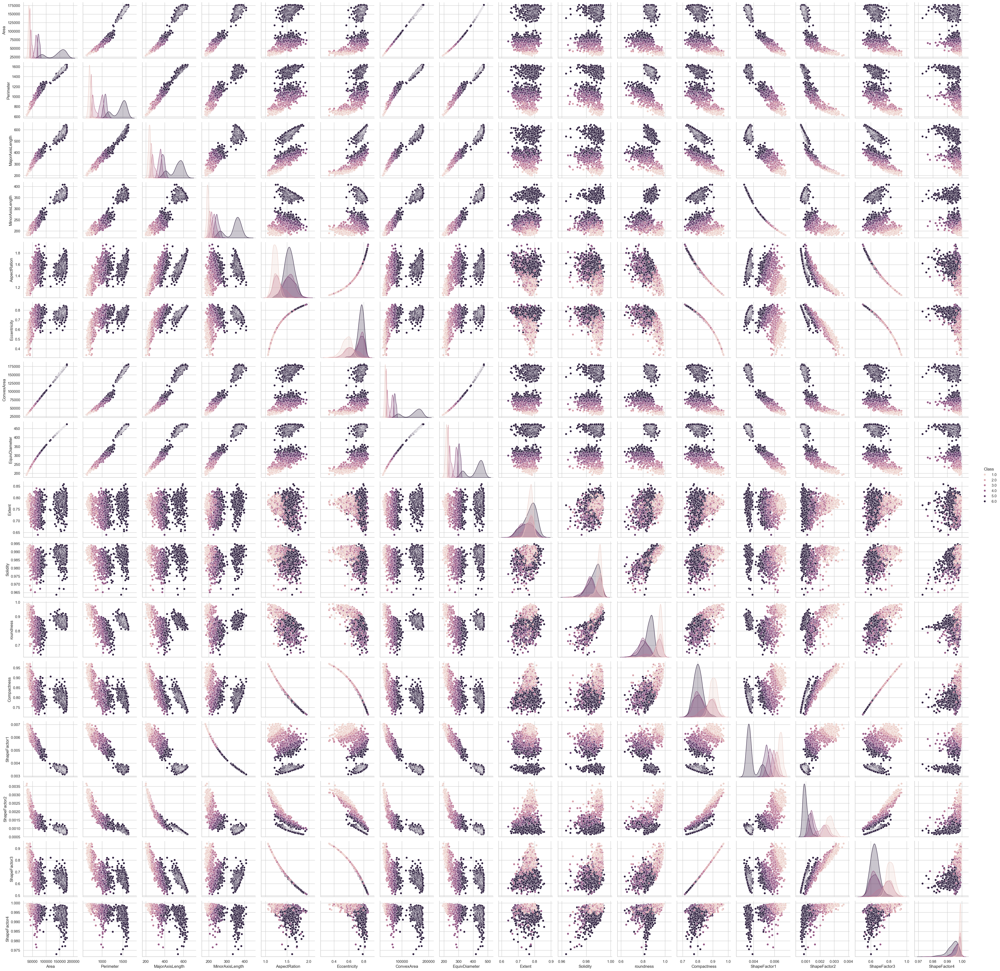

In [34]:
sns.pairplot(data=new_data, hue="Class")
plt.show()

## Split y Escalamiento de datos


In [35]:
# Hacer un split a los datos de entrenamiento y prueba.
X_train, X_test, y_train, y_test = train_test_split(
    X_res, y_res, test_size=0.2, random_state=42, shuffle=True
)

In [36]:
# Aplicar el Estandarizacino en X
st_x = StandardScaler()
X_train = st_x.fit_transform(X_train)
X_test = st_x.transform(X_test)

# Entrenamiento y evaluación de regresión logística multiclase

## Modelo Multiclase


Después de probar diferentes combinaciones de parámetros en nuestro modelo de regresión logística, obtuvimos el mejor desempeño utilizando la estrategia de clasificación multinomial (multi_class='multinomial') y el solver 'lbfgs'.

Con esta configuración, logramos obtener una precisión (accuracy) del 92.47%, lo que indica una buena capacidad del modelo para clasificar correctamente los tipos de frijoles en el conjunto de datos.


In [37]:
def logistic_model(C_, solver_, multi_class_):
    logistic_regression_model = LogisticRegression(
        max_iter=10000,
        random_state=42,
        solver=solver_,
        multi_class=multi_class_,
        n_jobs=-1,
        C=C_,
    )
    return logistic_regression_model

In [38]:
model = logistic_model(1, "saga", "multinomial")
model.fit(X_train, y_train)

predictions = model.predict(X_test)

print(confusion_matrix(y_test, predictions))
print(f"\nAccuracy: {accuracy_score(y_test, predictions)}")

[[214   7   0   1   1   3]
 [  7  95   0   0   0   1]
 [  0   0  90   0   5  10]
 [  0   4   1  91   0   0]
 [  3   0   0   0  84   4]
 [  0   1   6   6   0  97]]

Accuracy: 0.9179206566347469


In [39]:
multiclass = ["ovr", "multinomial"]
solver_list = ["newton-cg", "lbfgs", "liblinear", "sag", "saga"]
score = []
params = []
for i in multiclass:
    for j in solver_list:
        try:
            model = logistic_model(1, j, i)
            model.fit(X_train, y_train)
            predictions = model.predict(X_test)
            params.append(i + "-" + j)
            accuracy = accuracy_score(y_test, predictions)
            score.append(accuracy)
        except:
            None

In [40]:
score
params

['ovr-newton-cg',
 'ovr-lbfgs',
 'ovr-liblinear',
 'ovr-sag',
 'ovr-saga',
 'multinomial-newton-cg',
 'multinomial-lbfgs',
 'multinomial-sag',
 'multinomial-saga']

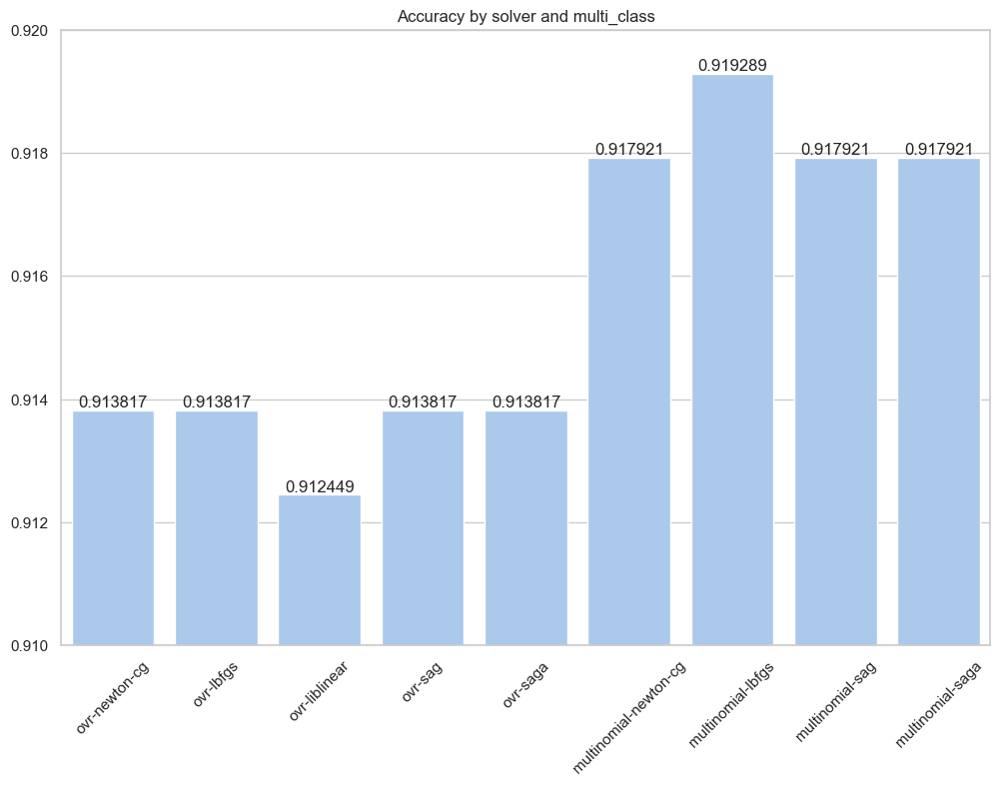

In [41]:
fig, axe = plt.subplots(figsize=(12, 8))

ax = sns.barplot(
    ax=axe,
    x=params,
    y=score,
)
ax.set_title("Accuracy by solver and multi_class")

ax.set_xticklabels(labels=params, rotation=45)
ax.bar_label(ax.containers[0])
plt.ylim([0.91, 0.92])
plt.show()

Una forma más sencilla de optimizar los hipeparámetros del modelo de Regresion Logistica es usando GridSearchCV


In [42]:
# Parameter grid
parameters = {
    "solver": ["newton-cg", "lbfgs", "liblinear", "sag", "saga"],
    "multi_class": ["ovr", "multinomial"],
}

In [43]:
model = LogisticRegression()
clf = GridSearchCV(model, param_grid=parameters, scoring="accuracy", cv=10)

In [44]:
logreg = LogisticRegression(max_iter=10000, n_jobs=-1, C=1)

clf = GridSearchCV(logreg, param_grid=parameters, scoring="accuracy", cv=5)

clf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(C=1, max_iter=10000, n_jobs=-1),
             param_grid={'multi_class': ['ovr', 'multinomial'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring='accuracy')

Esto también se usa para otros modelos de regresión y clasificación


In [45]:
print("Mejores HiperParametros: ", clf.best_params_)
print("Mejor accuracy: ", clf.best_score_)

# creacion de lista para los solver y los puntajas
solvers = []
scores = []
for params, mean_score in zip(
    clf.cv_results_["params"], clf.cv_results_["mean_test_score"]
):
    if params["multi_class"] == "multinomial" and not np.isnan(mean_score):
        solvers.append(params["solver"])
        scores.append(mean_score)
    print("Parameters: ", params)
    print("Mean Score: ", mean_score)
    print("==============================================================")

Mejores HiperParametros:  {'multi_class': 'multinomial', 'solver': 'newton-cg'}
Mejor accuracy:  0.9319183936307225
Parameters:  {'multi_class': 'ovr', 'solver': 'newton-cg'}
Mean Score:  0.9281559536354056
Parameters:  {'multi_class': 'ovr', 'solver': 'lbfgs'}
Mean Score:  0.9281559536354056
Parameters:  {'multi_class': 'ovr', 'solver': 'liblinear'}
Mean Score:  0.9267866760332513
Parameters:  {'multi_class': 'ovr', 'solver': 'sag'}
Mean Score:  0.9281559536354056
Parameters:  {'multi_class': 'ovr', 'solver': 'saga'}
Mean Score:  0.9281559536354056
Parameters:  {'multi_class': 'multinomial', 'solver': 'newton-cg'}
Mean Score:  0.9319183936307225
Parameters:  {'multi_class': 'multinomial', 'solver': 'lbfgs'}
Mean Score:  0.9315765132888421
Parameters:  {'multi_class': 'multinomial', 'solver': 'liblinear'}
Mean Score:  nan
Parameters:  {'multi_class': 'multinomial', 'solver': 'sag'}
Mean Score:  0.9315765132888421
Parameters:  {'multi_class': 'multinomial', 'solver': 'saga'}
Mean Score:

In [46]:
solvers

['newton-cg', 'lbfgs', 'sag', 'saga']

In [47]:
scores

[0.9319183936307225,
 0.9315765132888421,
 0.9315765132888421,
 0.9315765132888421]

El modelo clf ya se encuentra entrenado con los mejores hiperparámetros por lo que yase encuentra listo para hacer predicciones


In [48]:
predictions_2 = clf.predict(X_test)
print(confusion_matrix(y_test, predictions_2))
print("\n", accuracy_score(y_test, predictions_2))

[[214   7   0   1   1   3]
 [  7  95   0   0   0   1]
 [  0   0  90   0   5  10]
 [  0   4   1  91   0   0]
 [  3   0   0   0  84   4]
 [  0   1   6   6   0  97]]

 0.9179206566347469


## Evaluacion de resultados


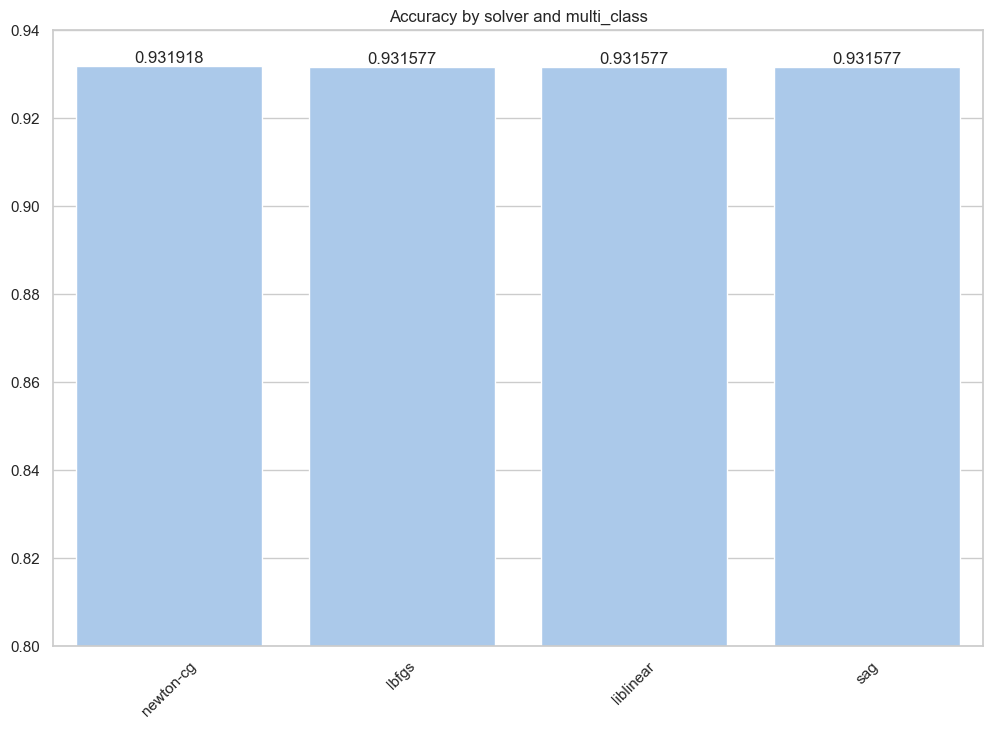

In [49]:
fig, axe = plt.subplots(figsize=(12, 8))

ax = sns.barplot(
    ax=axe,
    x=solvers,
    y=scores,
)
ax.set_title("Accuracy by solver and multi_class")

ax.set_xticklabels(labels=parameters["solver"], rotation=45)
ax.bar_label(ax.containers[0])
plt.ylim([0.80, 0.94])
plt.show()

pensando que habia overfiting use cross validation para verificar:


In [50]:
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

results_k = cross_val_score(clf, X_test, y_test, cv=kfold)

print(results_k.mean())

0.9206318143695835


el score es muy similar, lo que nos indicaria que no hay Overfiting


Vamos a usar los mejores hiperparametros


In [51]:
model = logistic_model(1, "newton-cg", "multinomial")
model.fit(X_train, y_train)

predictions = model.predict(X_test)

print(confusion_matrix(y_test, predictions))
print(accuracy_score(y_test, predictions))

[[214   7   0   1   1   3]
 [  7  95   0   0   0   1]
 [  0   0  90   0   5  10]
 [  0   4   1  91   0   0]
 [  3   0   0   0  84   4]
 [  0   1   6   6   0  97]]
0.9179206566347469


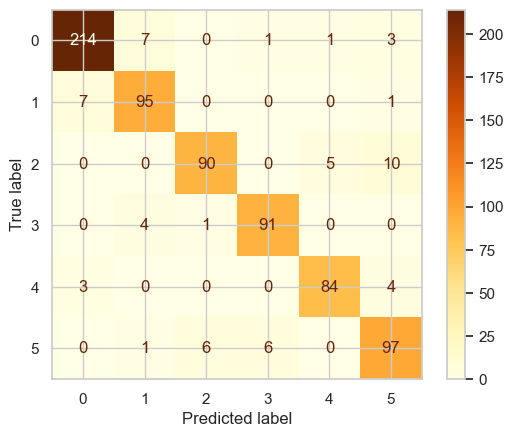

In [52]:
cm = confusion_matrix(y_test, predictions, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.YlOrBr)
plt.show()

Después de probar diferentes combinaciones de parámetros en nuestro modelo de regresión logística, obtuvimos el mejor desempeño utilizando la estrategia de clasificación multinomial (multi_class='multinomial') y el solver 'lbfgs'.

Con esta configuración, logramos obtener una precisión (accuracy) del 91.79%, lo que indica una buena capacidad del modelo para clasificar correctamente los tipos de frijoles en el conjunto de datos.
